In [2]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import tqdm
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F
import re
device = 'cuda'  # Use GPU if available
device = 'cpu'  # Use CPU if CUDA is not available

In [12]:
def plot_wavefield_video(wavefield_vx, wavefield_vz, save=False, title=None):
    """
    Visualize a 2D elastic wavefield as an animated video.
    Plots Vx and Vz components side by side over time.

    Parameters:
        wavefield_vx (ndarray): Wavefield component in x direction, shape (nt, nz, nx)
        wavefield_vz (ndarray): Wavefield component in z direction, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Extract time, vertical, and horizontal dimensions
    nt, nz, nx = wavefield_vx.shape

    # Set color scale limits based on max absolute wave amplitude (capped at 30%)
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create side-by-side subplots for Vx and Vz
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Initialize first frame of Vx wavefield
    im0 = axes[0].imshow(wavefield_vx[0, :, :], cmap='seismic', 
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[0].set_title("Vx")
    axes[0].set_xlabel("X (km)")
    axes[0].set_ylabel("Z (km)")

    # Initialize first frame of Vz wavefield
    im1 = axes[1].imshow(wavefield_vz[0, :, :], cmap='seismic', 
                         extent=[0, 128*20/1000, 64*20/1000, 0],
                         vmin=-vmax, vmax=vmax, animated=True)
    axes[1].set_title("Vz")
    axes[1].set_xlabel("X (km)")
    axes[1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Frame update function for animation
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        return [im0, im1]

    # Create animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Optionally save as GIF
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline in Jupyter
    return HTML(anim.to_jshtml())


def plot_wavefield_video_pred_gt(wavefield_vx, wavefield_vz, wavefield_vx_Y, wavefield_vz_Y, save=False, title=None):
    """
    Compare predicted and ground truth 2D elastic wavefields in an animation.
    Displays Vx and Vz for both prediction and ground truth in a 2×2 subplot.

    Parameters:
        wavefield_vx (ndarray): Predicted Vx component, shape (nt, nz, nx)
        wavefield_vz (ndarray): Predicted Vz component, shape (nt, nz, nx)
        wavefield_vx_Y (ndarray): Ground truth Vx component, shape (nt, nz, nx)
        wavefield_vz_Y (ndarray): Ground truth Vz component, shape (nt, nz, nx)
        save (bool): Whether to save the animation as a GIF
        title (str): Filename prefix for saving the animation (if save=True)

    Returns:
        HTML animation object (for Jupyter display)
    """
    # Dimensions of wavefield arrays
    nt, nz, nx = wavefield_vx.shape

    # Determine dynamic color scale limit
    vmax = np.max(np.abs([wavefield_vx, wavefield_vz])) * 0.3

    # Create 2x2 subplot layout: prediction (top), ground truth (bottom)
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))

    # Plot predicted Vx
    im0 = axes[0, 0].imshow(wavefield_vx[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 0].set_title("Vx prediction")
    axes[0, 0].set_xlabel("X (km)")
    axes[0, 0].set_ylabel("Z (km)")

    # Plot predicted Vz
    im1 = axes[0, 1].imshow(wavefield_vz[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[0, 1].set_title("Vz prediction")
    axes[0, 1].set_xlabel("X (km)")
    axes[0, 1].set_ylabel("Z (km)")

    # Plot ground truth Vx
    im2 = axes[1, 0].imshow(wavefield_vx_Y[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 0].set_title("Vx ground truth")
    axes[1, 0].set_xlabel("X (km)")
    axes[1, 0].set_ylabel("Z (km)")

    # Plot ground truth Vz
    im3 = axes[1, 1].imshow(wavefield_vz_Y[0, :, :], cmap='seismic', 
                            extent=[0, 128*20/1000, 64*20/1000, 0],
                            vmin=-vmax, vmax=vmax, animated=True)
    axes[1, 1].set_title("Vz ground truth")
    axes[1, 1].set_xlabel("X (km)")
    axes[1, 1].set_ylabel("Z (km)")

    fig.tight_layout()

    # Update function for all four subplots
    def update(frame):
        im0.set_array(wavefield_vx[frame, :, :])
        im1.set_array(wavefield_vz[frame, :, :])
        im2.set_array(wavefield_vx_Y[frame, :, :])
        im3.set_array(wavefield_vz_Y[frame, :, :])
        return [im0, im1, im2, im3]

    # Create the animation
    anim = FuncAnimation(fig, update, frames=nt, interval=50, blit=True)
    plt.close(fig)

    # Save as gif if requested
    if save:
        anim.save(f'{title}.gif', fps=10)

    # Display inline
    return HTML(anim.to_jshtml())


In [13]:
### LOAD ALL THE DATA FOR TRAINING + VALIDATION

# Gather all file paths from two directories: layered and random field simulations.
# Each file is assumed to represent one simulation sample.
all_waveforms = glob.glob('./layered_simulation/*') + glob.glob('./random_field_simulation/*')

number_of_samples = len(all_waveforms)
print('Number of samples for training and validation ', number_of_samples)

Number of samples for training and validation  500


# VISUALIZE DATA

Each .npy file in the folder contains a dictionary of physical and simulation parameters and partial wavefield data from a 2D elastic wave propagation simulation
| Key               | Shape / Type          | Description |
|-------------------|------------------------|-------------|
| `'ox'`, `'oz'`    | `float`                | Origin of the model (x, z = 0.0) |
| `'dx'`, `'dz'`    | `float`                | Grid spacing in x and z (20.0 m) |
| `'nx'`, `'nz'`    | `int`                  | Number of grid points (128 × 64) |
| `'nt'`            | `int`                  | Number of time steps (60) |
| `'dt'`            | `float`                | Time step size (0.03 s) |
| `'f0'`            | `float`                | Dominant source frequency (Hz) |
| `'amp'`           | `float`                | Source amplitude |
| `'source_loc'`    | `list[float]`          | Earthquake source location `[x, z]` |
| `'focal_mechanism'` | `list[float]`        | `[strike, dip, rake]` angles of the source |
| `'free_surface'`  | `bool`                 | Whether free-surface boundary is used |
| `'vp'`, `'vs'`, `'rho'` | `np.ndarray (64×128)` | P-wave, S-wave velocities (in m/s), and density (kg/m³) |
| `'wavefield_vx'`, `'wavefield_vz'` | `np.ndarray (60×64×128)` | Simulated wavefields in x and z directions — only **first 15 time steps** saved for prediction tasks |

In [84]:
all_waveforms[id_2_show]

'./layered_simulation/103.npy'

In [65]:
# Select a sample index to visualize
id_2_show = 0

# Load the .npy file containing simulation data
sample_2_show = np.load(all_waveforms[id_2_show], allow_pickle=True)

wavefield_vx = sample_2_show.item().get('wavefield_vx') # Extract the x-direction wavefield (shape: [15, 64, 128])
wavefield_vz = sample_2_show.item().get('wavefield_vz') # Extract the z-direction wavefield (shape: [15, 64, 128])
vp = sample_2_show.item().get('vp') # Extract the P-wave velocity field (Vp) [64×128], in m/s
vs = sample_2_show.item().get('vs') # Extract the S-wave velocity field (Vs) [64×128], in m/s
foc_x, foc_z = sample_2_show.item().get('source_loc') # Get the source (focal) location in meters

# Plot and save an animated video of the wavefield (Vx and Vz components)
plot_wavefield_video(wavefield_vx, wavefield_vz, save=True, title='wavefield')

MovieWriter ffmpeg unavailable; using Pillow instead.


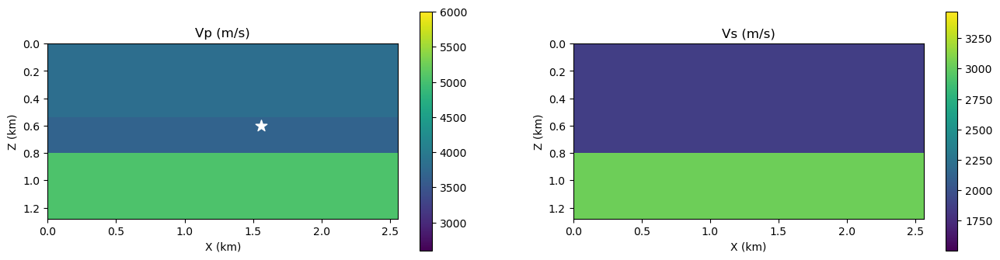

In [66]:
# Create a figure with 2 side-by-side subplots to show Vp and Vs models
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(16, 4))
# Plot Vp field (colorbar in m/s)
cbar1 = axes[0].imshow(vp, extent=[0, 128*20/1000, 64*20/1000, 0], 
                       vmin=2600, vmax=6000)
axes[0].set_title('Vp (m/s)')
axes[0].set_xlabel('X (km)')
axes[0].set_ylabel('Z (km)')
# Plot Vs field (colorbar scaled accordingly)
cbar2 = axes[1].imshow(vs, extent=[0, 128*20/1000, 64*20/1000, 0], 
                       vmin=2600/1.73, vmax=6000/1.73)
axes[1].set_title('Vs (m/s)')
axes[1].set_xlabel('X (km)')
axes[1].set_ylabel('Z (km)')
# Overlay focal source location on Vp plot
axes[0].scatter(foc_x / 1000, foc_z / 1000, marker='*', 
                s=120, color='white', label='Focal Center')
# Add colorbars to both subplots
fig.colorbar(cbar1, ax=axes[0])
fig.colorbar(cbar2, ax=axes[1])
plt.show()

# Data Preparation

In [14]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt = 60        # number of time steps in each wavefield

# Preallocate arrays to store all data
# all_wavefield: shape (n_samples, nt, nz, nx, 2) for vx and vz components
all_wavefield = np.zeros((number_of_samples, nt, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp = np.zeros((number_of_samples, nz, nx))
all_vs = np.zeros((number_of_samples, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp[i] = vp
    all_vs[i] = vs
    all_wavefield[i, :, :, :, 0] = wavefield_vx
    all_wavefield[i, :, :, :, 1] = wavefield_vz

# Define a normalization function (standard score)
def normalize(data):
    mean = np.mean(data)
    std = np.std(data)
    standardized_data_numpy = (data - mean) / std
    return standardized_data_numpy, mean, std

# Normalize the wavefield data (standardization over entire dataset)
all_wavefield, wavefield_mean, wavefield_std = normalize(all_wavefield)
all_vs, vs_mean, vs_std = normalize(all_vs)
all_vp, vp_mean, vp_std = normalize(all_vp)

In [12]:
np.random.seed(0)

# Randomly select 80% of the indices to use for training (no replacement)
train_idx = np.random.choice(len(all_wavefield), int(len(all_wavefield) * 0.8), replace=False)
# The remaining 20% of indices are used for validation
val_idx = list(set(np.arange(0, len(all_wavefield)).tolist()) - set(train_idx))

# Slice the wavefield and velocity data into training and validation sets
train_wavefield = all_wavefield[train_idx]  # shape: (N_train, nt, nz, nx, 2)
train_vp = all_vp[train_idx]                # shape: (N_train, nz, nx)
train_vs = all_vs[train_idx]                # shape: (N_train, nz, nx)

val_wavefield  = all_wavefield[val_idx]     # shape: (N_val, nt, nz, nx, 2)
val_vp  = all_vp[val_idx]                   # shape: (N_val, nz, nx)
val_vs  = all_vs[val_idx]                   # shape: (N_val, nz, nx)

# Print the resulting shapes to verify the split
print(train_wavefield.shape, val_wavefield.shape)

(400, 60, 64, 128, 2) (100, 60, 64, 128, 2)


In [15]:
# Prepare training data: create input-output pairs for one-step wavefield prediction
# Inputs: [vx_t, vz_t, vp, vs]; Output: [vx_{t+1}, vz_{t+1}]
X_list_train, Y_list_train = [], []

# Loop over time steps (starting from t=12 to exclude early wavefront buildup)
for t in tqdm.tqdm(range(12, train_wavefield.shape[1] - 1)):
    w_t = train_wavefield[:, t]        # Current wavefield at time t (shape: N, 64, 128, 2)
    w_tp1 = train_wavefield[:, t + 1]  # Target wavefield at next time step (t+1)

    vp_ = train_vp[:, :, :, None]      # Expand vp to (N, 64, 128, 1) for channel concatenation
    vs_ = train_vs[:, :, :, None]      # Expand vs to (N, 64, 128, 1)

    # Combine wavefield at t with static velocity model (vp, vs) → (N, 64, 128, 4)
    X = np.concatenate([w_t, vp_, vs_], axis=-1)

    X_list_train.append(X)
    Y_list_train.append(w_tp1)

# Stack all time steps into a single training dataset
X_train = np.concatenate(X_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 4)
Y_train = np.concatenate(Y_list_train, axis=0)  # Shape: (N_train * T, 64, 128, 2)


# Prepare validation data in the same way
X_list_val, Y_list_val = [], []

for t in tqdm.tqdm(range(12, val_wavefield.shape[1] - 1)):
    w_t = val_wavefield[:, t]
    w_tp1 = val_wavefield[:, t + 1]
    vp_ = val_vp[:, :, :, None]
    vs_ = val_vs[:, :, :, None]
    X = np.concatenate([w_t, vp_, vs_], axis=-1)
    X_list_val.append(X)
    Y_list_val.append(w_tp1)

X_val = np.concatenate(X_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 4)
Y_val = np.concatenate(Y_list_val, axis=0)  # Shape: (N_val * T, 64, 128, 2)

train_loader = DataLoader(
    TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                  torch.tensor(Y_train, dtype=torch.float32)),
    batch_size=16,
    shuffle=True
)

val_loader = DataLoader(
    TensorDataset(torch.tensor(X_val, dtype=torch.float32),
                  torch.tensor(Y_val, dtype=torch.float32)),
    batch_size=64,
    shuffle=False
)

100%|██████████| 47/47 [00:00<00:00, 57.41it/s]


In [7]:
class SpectralConv2d(nn.Module):
    def __init__(self, in_channels, out_channels, modes1, modes2):
        super(SpectralConv2d, self).__init__()
        """
        2D Fourier layer for the FNO.
        Performs: FFT → complex linear transform in frequency domain → inverse FFT.
        Only a subset of the lowest-frequency Fourier modes are retained.
        """

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.modes1 = modes1  # Number of Fourier modes in height direction
        self.modes2 = modes2  # Number of Fourier modes in width direction

        # Scale factor for initialization
        self.scale = 1 / (in_channels * out_channels)

        # Learnable complex-valued weights for selected Fourier modes
        self.weights1 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))
        self.weights2 = nn.Parameter(self.scale * torch.rand(in_channels, out_channels, self.modes1, self.modes2, dtype=torch.cfloat))

    def compl_mul2d(self, input, weights):
        """
        Perform complex multiplication using Einstein summation.
        Input: (B, in_channels, H, W_freq), Weights: (in_channels, out_channels, H, W_freq)
        Output: (B, out_channels, H, W_freq)
        """
        return torch.einsum("bixy,ioxy->boxy", input, weights)

    def forward(self, x):
        # x: (B, in_channels, H, W), spatial domain
        batchsize = x.shape[0]

        # Apply 2D FFT to convert to frequency domain
        x_ft = torch.fft.rfft2(x)

        # Allocate zero output in Fourier domain (only for selected modes)
        out_ft = torch.zeros(batchsize, self.out_channels, x.size(-2), x.size(-1)//2 + 1,
                             dtype=torch.cfloat, device=x.device)

        # Multiply selected low-frequency modes with learnable complex weights
        out_ft[:, :, :self.modes1, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, :self.modes1, :self.modes2], self.weights1)
        out_ft[:, :, -self.modes1:, :self.modes2] = self.compl_mul2d(
            x_ft[:, :, -self.modes1:, :self.modes2], self.weights2)

        # Inverse FFT to return to spatial domain
        x = torch.fft.irfft2(out_ft, s=(x.size(-2), x.size(-1)))
        return x


class FNO2d(nn.Module):
    def __init__(self, modes1, modes2, width, input_channel=6, output_channel=2):
        super(FNO2d, self).__init__()
        """
        2D Fourier Neural Operator (FNO) model.
        Architecture:
        1. Lift input to high-dimensional space using fc0.
        2. Apply 4 Fourier-integral layers (spectral convolution + pointwise conv).
        3. Project back to 2-channel output (vx, vz) using fc1 and fc2.
        """

        self.modes1 = modes1  # number of Fourier modes in height
        self.modes2 = modes2  # number of Fourier modes in width
        self.width = width    # number of channels/features in hidden layers
        self.padding = 12     # pad to reduce edge artifacts (for non-periodic BCs)

        # Input lifting layer: from 6-channel input to internal width
        # Input channels: [vx, vz, vp, vs, x_coord, y_coord]
        self.fc0 = nn.Linear(input_channel, self.width)

        # 4 layers of spectral + pointwise convolution blocks
        self.conv0 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv1 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv2 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)
        self.conv3 = SpectralConv2d(self.width, self.width, self.modes1, self.modes2)

        self.w0 = nn.Conv2d(self.width, self.width, 1)  # Pointwise conv for residual
        self.w1 = nn.Conv2d(self.width, self.width, 1)
        self.w2 = nn.Conv2d(self.width, self.width, 1)
        self.w3 = nn.Conv2d(self.width, self.width, 1)

        # Final projection layers: width → 32 → 2
        self.fc1 = nn.Linear(self.width, 32)
        self.fc2 = nn.Linear(32, output_channel)  # Output 2 components: vx and vz

    def forward(self, x):
        # Add normalized spatial coordinates as input channels
        grid = self.get_grid(x.shape, x.device)  # shape: (B, H, W, 2)
        x = torch.cat((x, grid), dim=-1)         # now x has 6 channels

        # Project to hidden width dimension
        x = self.fc0(x)                           # (B, H, W, width)
        x = x.permute(0, 3, 1, 2)                 # (B, width, H, W)

        # Pad for better boundary behavior
        x = F.pad(x, [0, self.padding, 0, self.padding])

        # 4 spectral layers with GELU activation
        x = F.gelu(self.conv0(x) + self.w0(x))
        x = F.gelu(self.conv1(x) + self.w1(x))
        x = F.gelu(self.conv2(x) + self.w2(x))
        x = self.conv3(x) + self.w3(x)

        # Remove padding
        x = x[..., :-self.padding, :-self.padding]

        # Project back to original spatial layout
        x = x.permute(0, 2, 3, 1)  # (B, H, W, width)
        x = F.gelu(self.fc1(x))
        x = self.fc2(x)            # Final output: (B, H, W, 2)
        return x

    def get_grid(self, shape, device):
        """
        Generate normalized [0,1] grid of x and y coordinates to provide positional context.
        Output shape: (B, H, W, 2)
        """
        batchsize, size_x, size_y = shape[0], shape[1], shape[2]
        gridx = torch.linspace(0, 1, size_x, device=device).reshape(1, size_x, 1, 1).repeat(batchsize, 1, size_y, 1)
        gridy = torch.linspace(0, 1, size_y, device=device).reshape(1, 1, size_y, 1).repeat(batchsize, size_x, 1, 1)
        return torch.cat((gridx, gridy), dim=-1)


In [19]:
# ----------- Hyperparameters -----------
epochs = 200                  # Total number of training epochs
lr = 5e-4                     # Initial learning rate

# ----------- Model, Optimizer, and Scheduler -----------
model = FNO2d(modes1=10, modes2=20, width=32).to(device)  # Initialize FNO model

optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

# ----------- Loss Function and Tracking -----------
criterion = nn.MSELoss()
train_losses, val_losses = [], []

# ----------- Training Loop -----------
for epoch in tqdm.tqdm(range(epochs), desc='Training'):
    model.train()
    running_train_loss = 0.0

    for x_batch, y_batch in train_loader:
        x_batch, y_batch = x_batch.to(device), y_batch.to(device)

        optimizer.zero_grad()
        preds = model(x_batch).reshape(-1, nz, nx, 2)  # Reshape to match label shape
        loss = criterion(preds.view(len(x_batch), -1), y_batch.view(len(y_batch), -1))
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()

    scheduler.step()  # Adjust learning rate

    # ----------- Validation Loop -----------
    model.eval()
    running_val_loss = 0.0

    with torch.no_grad():
        for x_val, y_val in val_loader:
            x_val, y_val = x_val.to(device), y_val.to(device)
            preds = model(x_val).reshape(-1, nz, nx, 2)
            loss = criterion(preds.view(len(x_val), -1), y_val.view(len(y_val), -1))
            running_val_loss += loss.item()

    # Average losses for the epoch
    avg_train_loss = running_train_loss / len(train_loader)
    avg_val_loss = running_val_loss / len(val_loader)

    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    # Progress display
    print(f"Epoch {epoch+1:03d} | Train Loss: {avg_train_loss:.6f} | Val Loss: {avg_val_loss:.6f}")


Training:   0%|          | 1/200 [00:17<57:27, 17.32s/it]

Epoch 001 | Train Loss: 0.240961 | Val Loss: 0.080698


Training:   1%|          | 2/200 [00:34<56:19, 17.07s/it]

Epoch 002 | Train Loss: 0.071269 | Val Loss: 0.056288


Training:   2%|▏         | 3/200 [00:51<55:57, 17.04s/it]

Epoch 003 | Train Loss: 0.053180 | Val Loss: 0.051699


Training:   2%|▏         | 4/200 [01:08<55:22, 16.95s/it]

Epoch 004 | Train Loss: 0.045211 | Val Loss: 0.045027


Training:   2%|▎         | 5/200 [01:24<55:02, 16.93s/it]

Epoch 005 | Train Loss: 0.040147 | Val Loss: 0.042115


Training:   3%|▎         | 6/200 [01:42<55:01, 17.02s/it]

Epoch 006 | Train Loss: 0.036846 | Val Loss: 0.038689


Training:   4%|▎         | 7/200 [01:59<55:11, 17.16s/it]

Epoch 007 | Train Loss: 0.033952 | Val Loss: 0.036839


Training:   4%|▍         | 8/200 [02:16<55:01, 17.19s/it]

Epoch 008 | Train Loss: 0.032301 | Val Loss: 0.034656


Training:   4%|▍         | 9/200 [02:34<54:56, 17.26s/it]

Epoch 009 | Train Loss: 0.029883 | Val Loss: 0.033312


Training:   5%|▌         | 10/200 [02:51<54:46, 17.30s/it]

Epoch 010 | Train Loss: 0.028313 | Val Loss: 0.032455


Training:   6%|▌         | 11/200 [03:08<54:24, 17.27s/it]

Epoch 011 | Train Loss: 0.027285 | Val Loss: 0.030896


Training:   6%|▌         | 12/200 [03:26<54:07, 17.27s/it]

Epoch 012 | Train Loss: 0.025931 | Val Loss: 0.031974


Training:   6%|▋         | 13/200 [03:43<53:46, 17.25s/it]

Epoch 013 | Train Loss: 0.025579 | Val Loss: 0.029841


Training:   7%|▋         | 14/200 [04:00<53:26, 17.24s/it]

Epoch 014 | Train Loss: 0.024456 | Val Loss: 0.028492


Training:   8%|▊         | 15/200 [04:17<53:00, 17.19s/it]

Epoch 015 | Train Loss: 0.023746 | Val Loss: 0.029030


Training:   8%|▊         | 16/200 [04:34<52:42, 17.19s/it]

Epoch 016 | Train Loss: 0.023395 | Val Loss: 0.027675


Training:   8%|▊         | 17/200 [04:51<52:15, 17.13s/it]

Epoch 017 | Train Loss: 0.022686 | Val Loss: 0.030098


Training:   9%|▉         | 18/200 [05:08<51:57, 17.13s/it]

Epoch 018 | Train Loss: 0.022557 | Val Loss: 0.027637


Training:  10%|▉         | 19/200 [05:25<51:28, 17.06s/it]

Epoch 019 | Train Loss: 0.022091 | Val Loss: 0.041255


Training:  10%|█         | 20/200 [05:42<51:12, 17.07s/it]

Epoch 020 | Train Loss: 0.021732 | Val Loss: 0.025768


Training:  10%|█         | 21/200 [05:59<50:42, 17.00s/it]

Epoch 021 | Train Loss: 0.020697 | Val Loss: 0.025384


Training:  11%|█         | 22/200 [06:16<50:28, 17.02s/it]

Epoch 022 | Train Loss: 0.020514 | Val Loss: 0.026074


Training:  12%|█▏        | 23/200 [06:33<50:01, 16.95s/it]

Epoch 023 | Train Loss: 0.020291 | Val Loss: 0.026414


Training:  12%|█▏        | 24/200 [06:50<49:45, 16.96s/it]

Epoch 024 | Train Loss: 0.020257 | Val Loss: 0.025347


Training:  12%|█▎        | 25/200 [07:07<49:21, 16.92s/it]

Epoch 025 | Train Loss: 0.019527 | Val Loss: 0.025462


Training:  13%|█▎        | 26/200 [07:24<49:19, 17.01s/it]

Epoch 026 | Train Loss: 0.019446 | Val Loss: 0.023002


Training:  14%|█▎        | 27/200 [07:41<49:04, 17.02s/it]

Epoch 027 | Train Loss: 0.019988 | Val Loss: 0.023222


Training:  14%|█▍        | 28/200 [07:59<49:26, 17.25s/it]

Epoch 028 | Train Loss: 0.018593 | Val Loss: 0.023045


Training:  14%|█▍        | 29/200 [08:16<49:22, 17.33s/it]

Epoch 029 | Train Loss: 0.018973 | Val Loss: 0.024144


Training:  15%|█▌        | 30/200 [08:34<49:18, 17.41s/it]

Epoch 030 | Train Loss: 0.018481 | Val Loss: 0.024274


Training:  16%|█▌        | 31/200 [08:51<48:57, 17.38s/it]

Epoch 031 | Train Loss: 0.017967 | Val Loss: 0.023931


Training:  16%|█▌        | 32/200 [09:09<48:38, 17.37s/it]

Epoch 032 | Train Loss: 0.019506 | Val Loss: 0.023027


Training:  16%|█▋        | 33/200 [09:26<48:13, 17.32s/it]

Epoch 033 | Train Loss: 0.017026 | Val Loss: 0.022328


Training:  17%|█▋        | 34/200 [09:43<47:54, 17.32s/it]

Epoch 034 | Train Loss: 0.017563 | Val Loss: 0.022415


Training:  18%|█▊        | 35/200 [10:01<47:35, 17.31s/it]

Epoch 035 | Train Loss: 0.017381 | Val Loss: 0.024435


Training:  18%|█▊        | 36/200 [10:18<47:11, 17.27s/it]

Epoch 036 | Train Loss: 0.017180 | Val Loss: 0.022104


Training:  18%|█▊        | 37/200 [10:35<46:50, 17.24s/it]

Epoch 037 | Train Loss: 0.016765 | Val Loss: 0.022431


Training:  19%|█▉        | 38/200 [10:52<46:23, 17.18s/it]

Epoch 038 | Train Loss: 0.017016 | Val Loss: 0.022003


Training:  20%|█▉        | 39/200 [11:09<45:58, 17.14s/it]

Epoch 039 | Train Loss: 0.016815 | Val Loss: 0.021885


Training:  20%|██        | 40/200 [11:26<45:34, 17.09s/it]

Epoch 040 | Train Loss: 0.016233 | Val Loss: 0.022702


Training:  20%|██        | 41/200 [11:43<45:13, 17.07s/it]

Epoch 041 | Train Loss: 0.016867 | Val Loss: 0.021772


Training:  21%|██        | 42/200 [12:00<44:53, 17.05s/it]

Epoch 042 | Train Loss: 0.016632 | Val Loss: 0.020922


Training:  22%|██▏       | 43/200 [12:17<44:30, 17.01s/it]

Epoch 043 | Train Loss: 0.015825 | Val Loss: 0.021153


Training:  22%|██▏       | 44/200 [12:34<44:06, 16.96s/it]

Epoch 044 | Train Loss: 0.016174 | Val Loss: 0.021260


Training:  22%|██▎       | 45/200 [12:51<43:49, 16.96s/it]

Epoch 045 | Train Loss: 0.015517 | Val Loss: 0.021418


Training:  23%|██▎       | 46/200 [13:08<43:32, 16.96s/it]

Epoch 046 | Train Loss: 0.015628 | Val Loss: 0.020688


Training:  24%|██▎       | 47/200 [13:25<43:17, 16.98s/it]

Epoch 047 | Train Loss: 0.015403 | Val Loss: 0.021540


Training:  24%|██▍       | 48/200 [13:42<43:09, 17.04s/it]

Epoch 048 | Train Loss: 0.015416 | Val Loss: 0.019956


Training:  24%|██▍       | 49/200 [13:59<43:18, 17.21s/it]

Epoch 049 | Train Loss: 0.015199 | Val Loss: 0.019707


Training:  25%|██▌       | 50/200 [14:17<43:04, 17.23s/it]

Epoch 050 | Train Loss: 0.015324 | Val Loss: 0.020590


Training:  26%|██▌       | 51/200 [14:34<43:06, 17.36s/it]

Epoch 051 | Train Loss: 0.015202 | Val Loss: 0.022167


Training:  26%|██▌       | 52/200 [14:52<42:46, 17.34s/it]

Epoch 052 | Train Loss: 0.014606 | Val Loss: 0.021086


Training:  26%|██▋       | 53/200 [15:09<42:40, 17.42s/it]

Epoch 053 | Train Loss: 0.014907 | Val Loss: 0.020248


Training:  27%|██▋       | 54/200 [15:27<42:15, 17.37s/it]

Epoch 054 | Train Loss: 0.014439 | Val Loss: 0.020302


Training:  28%|██▊       | 55/200 [15:44<42:04, 17.41s/it]

Epoch 055 | Train Loss: 0.014527 | Val Loss: 0.019850


Training:  28%|██▊       | 56/200 [16:01<41:46, 17.40s/it]

Epoch 056 | Train Loss: 0.014454 | Val Loss: 0.020227


Training:  28%|██▊       | 57/200 [16:19<41:35, 17.45s/it]

Epoch 057 | Train Loss: 0.014278 | Val Loss: 0.019676


Training:  29%|██▉       | 58/200 [16:36<41:07, 17.38s/it]

Epoch 058 | Train Loss: 0.014059 | Val Loss: 0.020048


Training:  30%|██▉       | 59/200 [16:54<40:50, 17.38s/it]

Epoch 059 | Train Loss: 0.014029 | Val Loss: 0.019014


Training:  30%|███       | 60/200 [17:11<40:24, 17.32s/it]

Epoch 060 | Train Loss: 0.013956 | Val Loss: 0.021495


Training:  30%|███       | 61/200 [17:28<40:14, 17.37s/it]

Epoch 061 | Train Loss: 0.013689 | Val Loss: 0.019955


Training:  31%|███       | 62/200 [17:45<39:46, 17.29s/it]

Epoch 062 | Train Loss: 0.013522 | Val Loss: 0.019199


Training:  32%|███▏      | 63/200 [18:03<39:25, 17.27s/it]

Epoch 063 | Train Loss: 0.013791 | Val Loss: 0.019972


Training:  32%|███▏      | 64/200 [18:20<38:58, 17.20s/it]

Epoch 064 | Train Loss: 0.013742 | Val Loss: 0.021876


Training:  32%|███▎      | 65/200 [18:37<38:40, 17.19s/it]

Epoch 065 | Train Loss: 0.013373 | Val Loss: 0.019572


Training:  33%|███▎      | 66/200 [18:54<38:18, 17.16s/it]

Epoch 066 | Train Loss: 0.013765 | Val Loss: 0.019005


Training:  34%|███▎      | 67/200 [19:11<37:57, 17.12s/it]

Epoch 067 | Train Loss: 0.013037 | Val Loss: 0.019322


Training:  34%|███▍      | 68/200 [19:28<37:34, 17.08s/it]

Epoch 068 | Train Loss: 0.013032 | Val Loss: 0.019858


Training:  34%|███▍      | 69/200 [19:45<37:20, 17.10s/it]

Epoch 069 | Train Loss: 0.013126 | Val Loss: 0.018385


Training:  35%|███▌      | 70/200 [20:02<37:14, 17.19s/it]

Epoch 070 | Train Loss: 0.012826 | Val Loss: 0.018841


Training:  36%|███▌      | 71/200 [20:24<40:06, 18.65s/it]

Epoch 071 | Train Loss: 0.013107 | Val Loss: 0.019978


Training:  36%|███▌      | 72/200 [20:43<39:27, 18.50s/it]

Epoch 072 | Train Loss: 0.012834 | Val Loss: 0.018613


Training:  36%|███▋      | 73/200 [21:00<38:39, 18.27s/it]

Epoch 073 | Train Loss: 0.012479 | Val Loss: 0.018753


Training:  37%|███▋      | 74/200 [21:18<37:45, 17.98s/it]

Epoch 074 | Train Loss: 0.012727 | Val Loss: 0.018723


Training:  38%|███▊      | 75/200 [21:35<37:21, 17.93s/it]

Epoch 075 | Train Loss: 0.012400 | Val Loss: 0.018566


Training:  38%|███▊      | 76/200 [21:53<36:50, 17.83s/it]

Epoch 076 | Train Loss: 0.012395 | Val Loss: 0.018902


Training:  38%|███▊      | 77/200 [22:11<36:20, 17.73s/it]

Epoch 077 | Train Loss: 0.012394 | Val Loss: 0.018562


Training:  39%|███▉      | 78/200 [22:28<35:43, 17.57s/it]

Epoch 078 | Train Loss: 0.012095 | Val Loss: 0.018408


Training:  40%|███▉      | 79/200 [22:45<35:14, 17.48s/it]

Epoch 079 | Train Loss: 0.012218 | Val Loss: 0.018587


Training:  40%|████      | 80/200 [23:03<34:57, 17.48s/it]

Epoch 080 | Train Loss: 0.012044 | Val Loss: 0.019200


Training:  40%|████      | 81/200 [23:20<34:34, 17.43s/it]

Epoch 081 | Train Loss: 0.011879 | Val Loss: 0.019078


Training:  41%|████      | 82/200 [23:37<34:09, 17.36s/it]

Epoch 082 | Train Loss: 0.011766 | Val Loss: 0.017905


Training:  42%|████▏     | 83/200 [23:54<33:41, 17.27s/it]

Epoch 083 | Train Loss: 0.011629 | Val Loss: 0.019336


Training:  42%|████▏     | 84/200 [24:11<33:17, 17.22s/it]

Epoch 084 | Train Loss: 0.011811 | Val Loss: 0.017693


Training:  42%|████▎     | 85/200 [24:28<33:00, 17.22s/it]

Epoch 085 | Train Loss: 0.011711 | Val Loss: 0.018705


Training:  43%|████▎     | 86/200 [24:46<32:44, 17.24s/it]

Epoch 086 | Train Loss: 0.011643 | Val Loss: 0.018912


Training:  44%|████▎     | 87/200 [25:03<32:18, 17.15s/it]

Epoch 087 | Train Loss: 0.011395 | Val Loss: 0.017392


Training:  44%|████▍     | 88/200 [25:20<31:58, 17.13s/it]

Epoch 088 | Train Loss: 0.011483 | Val Loss: 0.017240


Training:  44%|████▍     | 89/200 [25:37<31:39, 17.11s/it]

Epoch 089 | Train Loss: 0.011292 | Val Loss: 0.018457


Training:  45%|████▌     | 90/200 [25:54<31:35, 17.23s/it]

Epoch 090 | Train Loss: 0.011119 | Val Loss: 0.017601


Training:  46%|████▌     | 91/200 [26:12<31:17, 17.22s/it]

Epoch 091 | Train Loss: 0.011523 | Val Loss: 0.017872


Training:  46%|████▌     | 92/200 [26:29<31:10, 17.32s/it]

Epoch 092 | Train Loss: 0.011139 | Val Loss: 0.017345


Training:  46%|████▋     | 93/200 [26:46<30:55, 17.35s/it]

Epoch 093 | Train Loss: 0.011000 | Val Loss: 0.017997


Training:  47%|████▋     | 94/200 [27:04<30:44, 17.40s/it]

Epoch 094 | Train Loss: 0.010862 | Val Loss: 0.018354


Training:  48%|████▊     | 95/200 [27:21<30:30, 17.43s/it]

Epoch 095 | Train Loss: 0.010827 | Val Loss: 0.017875


Training:  48%|████▊     | 96/200 [27:39<30:18, 17.49s/it]

Epoch 096 | Train Loss: 0.010725 | Val Loss: 0.018382


Training:  48%|████▊     | 97/200 [27:56<29:51, 17.39s/it]

Epoch 097 | Train Loss: 0.010751 | Val Loss: 0.017516


Training:  49%|████▉     | 98/200 [28:14<29:29, 17.35s/it]

Epoch 098 | Train Loss: 0.010613 | Val Loss: 0.017787


Training:  50%|████▉     | 99/200 [28:31<29:02, 17.26s/it]

Epoch 099 | Train Loss: 0.010371 | Val Loss: 0.017295


Training:  50%|█████     | 100/200 [28:48<28:39, 17.20s/it]

Epoch 100 | Train Loss: 0.010471 | Val Loss: 0.018775


Training:  50%|█████     | 101/200 [29:05<28:23, 17.21s/it]

Epoch 101 | Train Loss: 0.010427 | Val Loss: 0.017368


Training:  51%|█████     | 102/200 [29:22<27:59, 17.14s/it]

Epoch 102 | Train Loss: 0.010261 | Val Loss: 0.017189


Training:  52%|█████▏    | 103/200 [29:39<27:35, 17.07s/it]

Epoch 103 | Train Loss: 0.010315 | Val Loss: 0.017885


Training:  52%|█████▏    | 104/200 [29:56<27:14, 17.02s/it]

Epoch 104 | Train Loss: 0.010243 | Val Loss: 0.016993


Training:  52%|█████▎    | 105/200 [30:13<26:56, 17.01s/it]

Epoch 105 | Train Loss: 0.010157 | Val Loss: 0.017169


Training:  53%|█████▎    | 106/200 [30:30<26:39, 17.01s/it]

Epoch 106 | Train Loss: 0.010057 | Val Loss: 0.016704


Training:  54%|█████▎    | 107/200 [30:47<26:19, 16.98s/it]

Epoch 107 | Train Loss: 0.009827 | Val Loss: 0.016564


Training:  54%|█████▍    | 108/200 [31:03<25:57, 16.93s/it]

Epoch 108 | Train Loss: 0.009945 | Val Loss: 0.017293


Training:  55%|█████▍    | 109/200 [31:20<25:39, 16.92s/it]

Epoch 109 | Train Loss: 0.009808 | Val Loss: 0.017179


Training:  55%|█████▌    | 110/200 [31:37<25:30, 17.00s/it]

Epoch 110 | Train Loss: 0.009686 | Val Loss: 0.016511


Training:  56%|█████▌    | 111/200 [31:55<25:33, 17.23s/it]

Epoch 111 | Train Loss: 0.009647 | Val Loss: 0.018509


Training:  56%|█████▌    | 112/200 [32:12<25:17, 17.24s/it]

Epoch 112 | Train Loss: 0.009560 | Val Loss: 0.017119


Training:  56%|█████▋    | 113/200 [32:30<25:02, 17.27s/it]

Epoch 113 | Train Loss: 0.009514 | Val Loss: 0.016978


Training:  57%|█████▋    | 114/200 [32:47<24:47, 17.29s/it]

Epoch 114 | Train Loss: 0.009468 | Val Loss: 0.016442


Training:  57%|█████▊    | 115/200 [33:04<24:27, 17.27s/it]

Epoch 115 | Train Loss: 0.009427 | Val Loss: 0.017000


Training:  58%|█████▊    | 116/200 [33:22<24:11, 17.28s/it]

Epoch 116 | Train Loss: 0.009297 | Val Loss: 0.016388


Training:  58%|█████▊    | 117/200 [33:39<23:54, 17.29s/it]

Epoch 117 | Train Loss: 0.009351 | Val Loss: 0.016558


Training:  59%|█████▉    | 118/200 [33:56<23:40, 17.33s/it]

Epoch 118 | Train Loss: 0.009093 | Val Loss: 0.016728


Training:  60%|█████▉    | 119/200 [34:14<23:20, 17.29s/it]

Epoch 119 | Train Loss: 0.009045 | Val Loss: 0.017234


Training:  60%|██████    | 120/200 [34:31<23:00, 17.26s/it]

Epoch 120 | Train Loss: 0.009060 | Val Loss: 0.017156


Training:  60%|██████    | 121/200 [34:48<22:50, 17.35s/it]

Epoch 121 | Train Loss: 0.009020 | Val Loss: 0.016950


Training:  61%|██████    | 122/200 [35:06<22:33, 17.36s/it]

Epoch 122 | Train Loss: 0.009001 | Val Loss: 0.016715


Training:  62%|██████▏   | 123/200 [35:23<22:21, 17.42s/it]

Epoch 123 | Train Loss: 0.008771 | Val Loss: 0.016312


Training:  62%|██████▏   | 124/200 [35:41<22:06, 17.46s/it]

Epoch 124 | Train Loss: 0.008710 | Val Loss: 0.016208


Training:  62%|██████▎   | 125/200 [35:58<21:43, 17.38s/it]

Epoch 125 | Train Loss: 0.008726 | Val Loss: 0.016205


Training:  63%|██████▎   | 126/200 [36:16<21:29, 17.43s/it]

Epoch 126 | Train Loss: 0.008584 | Val Loss: 0.016462


Training:  64%|██████▎   | 127/200 [36:33<21:01, 17.29s/it]

Epoch 127 | Train Loss: 0.008532 | Val Loss: 0.016359


Training:  64%|██████▍   | 128/200 [36:51<21:00, 17.51s/it]

Epoch 128 | Train Loss: 0.008487 | Val Loss: 0.016124


Training:  64%|██████▍   | 129/200 [37:08<20:30, 17.33s/it]

Epoch 129 | Train Loss: 0.008410 | Val Loss: 0.016461


Training:  68%|██████▊   | 137/200 [39:26<18:11, 17.32s/it]

Epoch 137 | Train Loss: 0.007980 | Val Loss: 0.016146


Training:  69%|██████▉   | 138/200 [39:43<17:50, 17.26s/it]

Epoch 138 | Train Loss: 0.007976 | Val Loss: 0.016170


Training:  70%|██████▉   | 139/200 [40:01<17:31, 17.23s/it]

Epoch 139 | Train Loss: 0.007838 | Val Loss: 0.016303


Training:  70%|███████   | 140/200 [40:18<17:10, 17.17s/it]

Epoch 140 | Train Loss: 0.007880 | Val Loss: 0.016910


Training:  70%|███████   | 141/200 [40:35<16:55, 17.20s/it]

Epoch 141 | Train Loss: 0.007682 | Val Loss: 0.016218


Training:  71%|███████   | 142/200 [40:52<16:33, 17.13s/it]

Epoch 142 | Train Loss: 0.007635 | Val Loss: 0.015982


Training:  72%|███████▏  | 143/200 [41:09<16:17, 17.15s/it]

Epoch 143 | Train Loss: 0.007633 | Val Loss: 0.015917


Training:  72%|███████▏  | 144/200 [41:26<15:56, 17.08s/it]

Epoch 144 | Train Loss: 0.007562 | Val Loss: 0.015899


Training:  72%|███████▎  | 145/200 [41:43<15:38, 17.06s/it]

Epoch 145 | Train Loss: 0.007493 | Val Loss: 0.015846


Training:  73%|███████▎  | 146/200 [42:00<15:20, 17.04s/it]

Epoch 146 | Train Loss: 0.007469 | Val Loss: 0.016301


Training:  74%|███████▎  | 147/200 [42:17<15:02, 17.03s/it]

Epoch 147 | Train Loss: 0.007420 | Val Loss: 0.015705


Training:  74%|███████▍  | 148/200 [42:34<14:42, 16.97s/it]

Epoch 148 | Train Loss: 0.007331 | Val Loss: 0.015656


Training:  74%|███████▍  | 149/200 [42:51<14:24, 16.94s/it]

Epoch 149 | Train Loss: 0.007287 | Val Loss: 0.015830


Training:  75%|███████▌  | 150/200 [43:07<14:04, 16.89s/it]

Epoch 150 | Train Loss: 0.007268 | Val Loss: 0.015606


Training:  76%|███████▌  | 151/200 [43:25<13:56, 17.08s/it]

Epoch 151 | Train Loss: 0.007218 | Val Loss: 0.016057


Training:  76%|███████▌  | 152/200 [43:42<13:42, 17.13s/it]

Epoch 152 | Train Loss: 0.007159 | Val Loss: 0.016104


Training:  76%|███████▋  | 153/200 [44:00<13:29, 17.23s/it]

Epoch 153 | Train Loss: 0.007130 | Val Loss: 0.015799


Training:  77%|███████▋  | 154/200 [44:17<13:11, 17.20s/it]

Epoch 154 | Train Loss: 0.007061 | Val Loss: 0.015872


Training:  78%|███████▊  | 155/200 [44:34<12:57, 17.27s/it]

Epoch 155 | Train Loss: 0.007032 | Val Loss: 0.015615


Training:  78%|███████▊  | 156/200 [44:51<12:38, 17.25s/it]

Epoch 156 | Train Loss: 0.006955 | Val Loss: 0.015679


Training:  78%|███████▊  | 157/200 [45:09<12:24, 17.32s/it]

Epoch 157 | Train Loss: 0.006915 | Val Loss: 0.015551


Training:  79%|███████▉  | 158/200 [45:26<12:04, 17.26s/it]

Epoch 158 | Train Loss: 0.006894 | Val Loss: 0.015669


Training:  80%|███████▉  | 159/200 [45:44<11:51, 17.35s/it]

Epoch 159 | Train Loss: 0.006862 | Val Loss: 0.015644


Training:  80%|████████  | 160/200 [46:01<11:33, 17.33s/it]

Epoch 160 | Train Loss: 0.006816 | Val Loss: 0.015745


Training:  80%|████████  | 161/200 [46:18<11:16, 17.34s/it]

Epoch 161 | Train Loss: 0.006765 | Val Loss: 0.015631


Training:  81%|████████  | 162/200 [46:35<10:55, 17.26s/it]

Epoch 162 | Train Loss: 0.006731 | Val Loss: 0.015597


Training:  82%|████████▏ | 163/200 [46:52<10:37, 17.23s/it]

Epoch 163 | Train Loss: 0.006690 | Val Loss: 0.015680


Training:  82%|████████▏ | 164/200 [47:09<10:16, 17.13s/it]

Epoch 164 | Train Loss: 0.006663 | Val Loss: 0.015662


Training:  82%|████████▎ | 165/200 [47:26<09:58, 17.09s/it]

Epoch 165 | Train Loss: 0.006623 | Val Loss: 0.015520


Training:  83%|████████▎ | 166/200 [47:43<09:39, 17.05s/it]

Epoch 166 | Train Loss: 0.006592 | Val Loss: 0.015618


Training:  84%|████████▎ | 167/200 [48:00<09:22, 17.05s/it]

Epoch 167 | Train Loss: 0.006566 | Val Loss: 0.015578


Training:  84%|████████▍ | 168/200 [48:17<09:02, 16.97s/it]

Epoch 168 | Train Loss: 0.006536 | Val Loss: 0.015663


Training:  84%|████████▍ | 169/200 [48:34<08:45, 16.95s/it]

Epoch 169 | Train Loss: 0.006497 | Val Loss: 0.015550


Training:  85%|████████▌ | 170/200 [48:51<08:27, 16.90s/it]

Epoch 170 | Train Loss: 0.006468 | Val Loss: 0.015572


Training:  86%|████████▌ | 171/200 [49:08<08:10, 16.93s/it]

Epoch 171 | Train Loss: 0.006442 | Val Loss: 0.015531


Training:  86%|████████▌ | 172/200 [49:25<07:57, 17.04s/it]

Epoch 172 | Train Loss: 0.006421 | Val Loss: 0.015524


Training:  86%|████████▋ | 173/200 [49:43<07:43, 17.16s/it]

Epoch 173 | Train Loss: 0.006393 | Val Loss: 0.015576


Training:  87%|████████▋ | 174/200 [50:00<07:26, 17.18s/it]

Epoch 174 | Train Loss: 0.006363 | Val Loss: 0.015548


Training:  88%|████████▊ | 175/200 [50:17<07:11, 17.26s/it]

Epoch 175 | Train Loss: 0.006341 | Val Loss: 0.015421


Training:  88%|████████▊ | 176/200 [50:34<06:53, 17.24s/it]

Epoch 176 | Train Loss: 0.006319 | Val Loss: 0.015456


Training:  88%|████████▊ | 177/200 [50:52<06:39, 17.35s/it]

Epoch 177 | Train Loss: 0.006299 | Val Loss: 0.015450


Training:  89%|████████▉ | 178/200 [51:09<06:20, 17.29s/it]

Epoch 178 | Train Loss: 0.006275 | Val Loss: 0.015380


Training:  90%|████████▉ | 179/200 [51:28<06:10, 17.66s/it]

Epoch 179 | Train Loss: 0.006258 | Val Loss: 0.015525


Training:  90%|█████████ | 180/200 [51:49<06:17, 18.88s/it]

Epoch 180 | Train Loss: 0.006239 | Val Loss: 0.015436


Training:  90%|█████████ | 181/200 [52:07<05:48, 18.36s/it]

Epoch 181 | Train Loss: 0.006220 | Val Loss: 0.015444


Training:  91%|█████████ | 182/200 [52:24<05:24, 18.05s/it]

Epoch 182 | Train Loss: 0.006204 | Val Loss: 0.015500


Training:  92%|█████████▏| 183/200 [52:41<05:02, 17.80s/it]

Epoch 183 | Train Loss: 0.006187 | Val Loss: 0.015447


Training:  92%|█████████▏| 184/200 [52:58<04:41, 17.60s/it]

Epoch 184 | Train Loss: 0.006170 | Val Loss: 0.015454


Training:  92%|█████████▎| 185/200 [53:16<04:22, 17.53s/it]

Epoch 185 | Train Loss: 0.006156 | Val Loss: 0.015414


Training:  93%|█████████▎| 186/200 [53:33<04:04, 17.45s/it]

Epoch 186 | Train Loss: 0.006143 | Val Loss: 0.015456


Training:  94%|█████████▎| 187/200 [53:51<03:47, 17.48s/it]

Epoch 187 | Train Loss: 0.006131 | Val Loss: 0.015431


Training:  94%|█████████▍| 188/200 [54:07<03:27, 17.31s/it]

Epoch 188 | Train Loss: 0.006119 | Val Loss: 0.015467


Training:  94%|█████████▍| 189/200 [54:25<03:10, 17.33s/it]

Epoch 189 | Train Loss: 0.006108 | Val Loss: 0.015422


Training:  95%|█████████▌| 190/200 [54:42<02:53, 17.33s/it]

Epoch 190 | Train Loss: 0.006098 | Val Loss: 0.015445


Training:  96%|█████████▌| 191/200 [55:00<02:37, 17.53s/it]

Epoch 191 | Train Loss: 0.006089 | Val Loss: 0.015419


Training:  96%|█████████▌| 192/200 [55:18<02:20, 17.59s/it]

Epoch 192 | Train Loss: 0.006081 | Val Loss: 0.015463


Training:  96%|█████████▋| 193/200 [55:35<02:02, 17.53s/it]

Epoch 193 | Train Loss: 0.006073 | Val Loss: 0.015411


Training:  97%|█████████▋| 194/200 [55:53<01:45, 17.51s/it]

Epoch 194 | Train Loss: 0.006066 | Val Loss: 0.015417


Training:  98%|█████████▊| 195/200 [56:11<01:28, 17.61s/it]

Epoch 195 | Train Loss: 0.006060 | Val Loss: 0.015423


Training:  98%|█████████▊| 196/200 [56:28<01:10, 17.61s/it]

Epoch 196 | Train Loss: 0.006055 | Val Loss: 0.015420


Training:  98%|█████████▊| 197/200 [56:46<00:53, 17.69s/it]

Epoch 197 | Train Loss: 0.006051 | Val Loss: 0.015412


Training:  99%|█████████▉| 198/200 [57:03<00:35, 17.60s/it]

Epoch 198 | Train Loss: 0.006047 | Val Loss: 0.015420


Training: 100%|█████████▉| 199/200 [57:21<00:17, 17.57s/it]

Epoch 199 | Train Loss: 0.006045 | Val Loss: 0.015419


Training: 100%|██████████| 200/200 [57:38<00:00, 17.29s/it]

Epoch 200 | Train Loss: 0.006043 | Val Loss: 0.015419


In [20]:
torch.save(model, "./fno4waves2d_64_128.pickle")

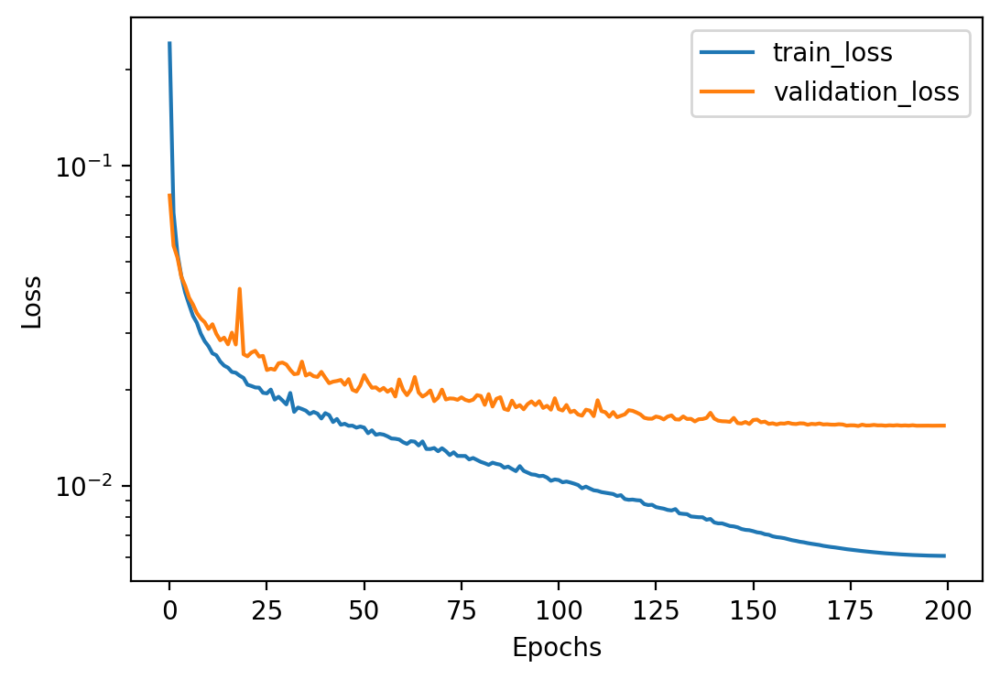

In [23]:
fig, ax = plt.subplots(figsize=(6, 4), dpi=200)
ax.plot(train_losses, label='train_loss')
ax.plot(val_losses , label='validation_loss')
plt.legend()
ax.set_yscale('log')
ax.set_xlabel('Epochs')
ax.set_ylabel('Loss')
fig.show()

In [31]:
# ----------- Setup Inference Parameters -----------
sample_id = 0                  # Index of training sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Training Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = train_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = train_vp[sample_id]                    # shape: (64, 128)
vs = train_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1], 
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='training_exmaple')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [36]:
# ----------- Setup Inference Parameters -----------
sample_id = 20                  # Index of validation sample to test
start_frame = 14                # Starting time step for prediction

# ----------- Extract Initial Inputs from Validation Set -----------
# Get wavefield (vx, vz), and velocity model (vp, vs) for the selected sample
wavefield_seq = val_wavefield[sample_id]  # shape: (60, 64, 128, 2)
vp = val_vp[sample_id]                    # shape: (64, 128)
vs = val_vs[sample_id]                    # shape: (64, 128)

# Get the current wavefield snapshot at the prediction start time
initial_snapshot = wavefield_seq[start_frame]  # shape: (64, 128, 2)

# Construct the model input: [vx, vz, vp, vs]
# Add batch dimension and concatenate velocity fields
current_input = np.zeros((1, 64, 128, 4), dtype=np.float32)
current_input[..., :2] = initial_snapshot
current_input[..., 2] = vp
current_input[..., 3] = vs

# ----------- Perform Autoregressive Prediction -----------
predicted_frames = []

with torch.no_grad():
    for _ in range(60 - start_frame - 1):  # Predict from t=start_frame+1 to t=59
        input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)

        # Model inference
        output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
        predicted_frames.append(output[0])          # Remove batch dimension

        # Use the output as the next input (autoregressive update)
        current_input[..., :2] = output[0]  # Update only vx, vz

# ----------- Combine Ground Truth (Before) and Prediction (After) -----------
# Final predicted sequence: true wavefield up to start_frame, then predictions
predicted_wavefield = np.concatenate((wavefield_seq[:start_frame+1], np.array(predicted_frames)), axis=0)  # shape: (60, 64, 128, 2)
plot_wavefield_video_pred_gt(predicted_wavefield[...,0], predicted_wavefield[...,1], 
                     wavefield_seq[...,0], wavefield_seq[...,1], save=True, title='validation_exmaple')

MovieWriter ffmpeg unavailable; using Pillow instead.


# Make Prediction on the Test Set

In [31]:
model = torch.load("./fno4waves2d_64_128.pickle", map_location=torch.device(device))

/tmp/ipykernel_252205/4281608414.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("./fno4waves2d_64_128.pickle", map_location=torch.device(device))


In [32]:
all_waveforms_test = glob.glob('./layered_simulation_test/*') + glob.glob('./random_field_simulation_test/*')

number_of_samples_test = len(all_waveforms_test)
print('Number of samples for test ', number_of_samples_test)
# Sort using the number extracted from the filename
all_waveforms_test = sorted(all_waveforms_test, key=lambda x: int(re.search(r'(\d+)\.npy$', x).group(1)))
all_waveforms_test

Number of samples for test  100


['./layered_simulation_test/0.npy',
 './layered_simulation_test/1.npy',
 './layered_simulation_test/2.npy',
 './layered_simulation_test/3.npy',
 './layered_simulation_test/4.npy',
 './layered_simulation_test/5.npy',
 './layered_simulation_test/6.npy',
 './layered_simulation_test/7.npy',
 './layered_simulation_test/8.npy',
 './layered_simulation_test/9.npy',
 './layered_simulation_test/10.npy',
 './layered_simulation_test/11.npy',
 './layered_simulation_test/12.npy',
 './layered_simulation_test/13.npy',
 './layered_simulation_test/14.npy',
 './layered_simulation_test/15.npy',
 './layered_simulation_test/16.npy',
 './layered_simulation_test/17.npy',
 './layered_simulation_test/18.npy',
 './layered_simulation_test/19.npy',
 './layered_simulation_test/20.npy',
 './layered_simulation_test/21.npy',
 './layered_simulation_test/22.npy',
 './layered_simulation_test/23.npy',
 './layered_simulation_test/24.npy',
 './layered_simulation_test/25.npy',
 './layered_simulation_test/26.npy',
 './layered

In [33]:
# Define grid and time dimensions
nx = 128       # number of grid points in x-direction
nz = 64        # number of grid points in z-direction
nt_test = 15        # number of time steps in each wavefield

all_wavefield_test = np.zeros((number_of_samples_test, nt_test, nz, nx, 2))

# all_vp and all_vs: shape (n_samples, nz, nx) for P-wave and S-wave velocities
all_vp_test = np.zeros((number_of_samples_test, nz, nx))
all_vs_test = np.zeros((number_of_samples_test, nz, nx))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_waveforms_test):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Extract velocity models
    vp = sample.item().get('vp')  # shape: (nz, nx)
    vs = sample.item().get('vs')  # shape: (nz, nx)

    # Assign to preallocated arrays
    all_vp_test[i] = vp
    all_vs_test[i] = vs
    all_wavefield_test[i, :, :, :, 0] = wavefield_vx
    all_wavefield_test[i, :, :, :, 1] = wavefield_vz

all_wavefield_test = (all_wavefield_test - wavefield_mean) / wavefield_std
all_vp_test = (all_vp_test - vp_mean) / vp_std
all_vs_test = (all_vs_test - vs_mean) / vs_std

print(all_wavefield_test.shape, all_vp_test.shape, all_vs_test.shape)

(100, 15, 64, 128, 2) (100, 64, 128) (100, 64, 128)


In [61]:
# Output container: 100 samples, 45 time steps, 64×128 grid, 2 components (vx, vz)
n_samples_test = all_wavefield_test.shape[0]
nt_future = 45

# Initialize output array
all_predictions_test = np.zeros((n_samples_test, nt_future, nz, nx, 2), dtype=np.float32)

# Loop over each test sample
for sample_id in tqdm.tqdm(range(n_samples_test), desc="Predicting test set"):
    # Extract initial 15-frame wavefield and velocity model
    wavefield_seq = all_wavefield_test[sample_id]  # (15, 64, 128, 2)
    vp = all_vp_test[sample_id]                    # (64, 128)
    vs = all_vs_test[sample_id]                    # (64, 128)

    # Start autoregressive prediction from frame 14
    current_input = np.zeros((1, nz, nx, 4), dtype=np.float32)
    current_input[..., :2] = wavefield_seq[-1]     # Use last given frame as input
    current_input[..., 2] = vp
    current_input[..., 3] = vs

    # Collect predicted frames for this sample
    predicted_seq = []

    with torch.no_grad():
        for _ in range(nt_future):
            input_tensor = torch.tensor(current_input, dtype=torch.float32).to(device)
            output = model(input_tensor).cpu().numpy()  # shape: (1, 64, 128, 2)
            predicted_frame = output[0]
            predicted_seq.append(predicted_frame)
            current_input[..., :2] = predicted_frame  # update vx, vz

    # Save all predicted frames for this sample
    all_predictions_test[sample_id] = np.stack(predicted_seq, axis=0)

# Final shape: (100, 45, 64, 128, 2)
print("Prediction complete:", all_predictions_test.shape)

Predicting test set: 100%|██████████| 100/100 [02:56<00:00,  1.77s/it]

Prediction complete: (100, 45, 64, 128, 2)


In [81]:
#
all_predictions_test = all_predictions_test * wavefield_std + wavefield_mean
wavefield_data = all_predictions_test # shape (100, 45, 64, 128, 2)
flattened_per_sample = wavefield_data.reshape(100, -1).astype('float32')
# Create a DataFrame and save to CSV
df = pd.DataFrame(flattened_per_sample).T
df.insert(0, 'ID', np.arange(len(df)))
df.to_csv("wavefield_predictions.csv", index=False)

In [60]:
# all_wavefield_test[sample_2_show].max()
# pred_frames.max()

11485.961

In [57]:
sample_2_show = 55
first_few_frames = all_wavefield_test[sample_2_show] * wavefield_std + wavefield_mean
pred_frames = all_predictions_test[sample_2_show]
all_frames = np.concatenate((first_few_frames, pred_frames), axis=0)
plot_wavefield_video(all_frames[...,0], all_frames[...,1], save=True, title='test')

MovieWriter ffmpeg unavailable; using Pillow instead.


In [42]:
all_test_answer = glob.glob('./layered_simulation_test_answer/*') + glob.glob('./random_field_simulation_test_answer/*')
all_test_answer = sorted(all_test_answer, key=lambda x: int(re.search(r'(\d+)\.npy$', x).group(1)))
all_test_answer

['./layered_simulation_test_answer/0.npy',
 './layered_simulation_test_answer/1.npy',
 './layered_simulation_test_answer/2.npy',
 './layered_simulation_test_answer/3.npy',
 './layered_simulation_test_answer/4.npy',
 './layered_simulation_test_answer/5.npy',
 './layered_simulation_test_answer/6.npy',
 './layered_simulation_test_answer/7.npy',
 './layered_simulation_test_answer/8.npy',
 './layered_simulation_test_answer/9.npy',
 './layered_simulation_test_answer/10.npy',
 './layered_simulation_test_answer/11.npy',
 './layered_simulation_test_answer/12.npy',
 './layered_simulation_test_answer/13.npy',
 './layered_simulation_test_answer/14.npy',
 './layered_simulation_test_answer/15.npy',
 './layered_simulation_test_answer/16.npy',
 './layered_simulation_test_answer/17.npy',
 './layered_simulation_test_answer/18.npy',
 './layered_simulation_test_answer/19.npy',
 './layered_simulation_test_answer/20.npy',
 './layered_simulation_test_answer/21.npy',
 './layered_simulation_test_answer/22.npy'

In [68]:
nt_test = 45
all_test_answer_wf = np.zeros((number_of_samples_test, nt_test, nz, nx, 2))

# Loop over each saved waveform file and populate the data arrays
for i, one_wf_path in enumerate(all_test_answer):
    sample = np.load(one_wf_path, allow_pickle=True)  # Load .npy file as dictionary

    # Extract vx and vz wavefield components
    wavefield_vx = sample.item().get('wavefield_vx')  # shape: (nt, nz, nx)
    wavefield_vz = sample.item().get('wavefield_vz')  # shape: (nt, nz, nx)

    # Assign to preallocated arrays
    all_test_answer_wf[i, :, :, :, 0] = wavefield_vx
    all_test_answer_wf[i, :, :, :, 1] = wavefield_vz

# all_test_answer_wf = (all_test_answer_wf c
all_test_answer_wf = all_test_answer_wf.astype('float16')
print(all_test_answer_wf.shape)

(100, 45, 64, 128, 2)


In [44]:
len(df)//2

368640

In [83]:
import pandas as pd
# your tensor: shape (samples=100, time=45, z=64, x=128, 2)
wavefield_data = all_test_answer_wf.astype('float32')
flattened_per_sample = wavefield_data.reshape(100, -1)
# Create a DataFrame and save to CSV
df = pd.DataFrame(flattened_per_sample).T
df.insert(0, 'ID', np.arange(len(df)))
df.loc[:, 'Usage'] = 'Public'
# df.loc[len(df)//2:, 'Usage'] = 'Private'
df.to_csv("wavefield_groundtruth.csv", index=False)

In [71]:
criterion = nn.MSELoss()
X = torch.tensor(all_test_answer_wf)
Y = torch.tensor(all_predictions_test)
criterion(X.view(len(X), -1), Y.view(len(Y), -1))

tensor(47152.1797)

In [72]:
criterion = nn.MSELoss()
X = torch.tensor(np.zeros(all_test_answer_wf.shape).astype('float32'))
Y = torch.tensor(all_test_answer_wf)
criterion(X.view(len(X), -1), Y.view(len(Y), -1))

tensor(64063.0547)

AttributeError: module 'matplotlib.pyplot' has no attribute 'set_yscale'

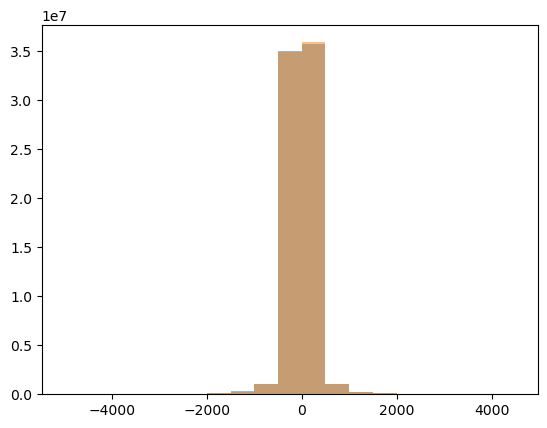

In [78]:
plt.hist(all_test_answer_wf.flatten(), bins=np.arange(-5000, 5000, 500),alpha=0.5)
plt.hist(all_predictions_test.flatten(), bins=np.arange(-5000, 5000, 500),alpha=0.5)
plt.set_yscale('log')

In [64]:
sample_2_show = 10
first_few_frames = all_wavefield_test[sample_2_show]
ans_frames = all_test_answer_wf[sample_2_show]
all_frames = np.concatenate((first_few_frames, ans_frames), axis=0)
plot_wavefield_video(all_frames[...,0], all_frames[...,1], save=True, title='test')

MovieWriter ffmpeg unavailable; using Pillow instead.
